<a href="https://colab.research.google.com/github/zeidanbm/object-detection-of-self-driving-vehicles/blob/master/code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pre-requisites

1.   The data zip file needs to be placed on google drive, inside an empty
"Machine Learning" folder





# Environment Setup

In [ ]:
!pip install -U --pre tensorflow=="2.*"
!pip install tf_slim
!pip install pycocotools
!pip install gputil

     |████████████████████████████████| 352 kB 5.1 MB/s 
  Created wheel for gputil: filename=GPUtil-1.4.0-py3-none-any.whl size=7411 sha256=e629af5eaf244d2a32c093a1eb1a48f4a6977440424f245d9a3a51e4dbeba964
  Stored in directory: /root/.cache/pip/wheels/6e/f8/83/534c52482d6da64622ddbf72cd93c35d2ef2881b78fd08ff0c
Successfully built gputil


In [ ]:
import sys
import tarfile
import zipfile
import GPUtil as GPU
#from collections import defaultdict
#from io import StringIO
from matplotlib import pyplot as plt
from IPython.display import display
from six import BytesIO
from google.colab import drive
import numpy as np
import pandas as pd
from PIL import Image
#from PIL import ImageColor
#from PIL import ImageDraw
#from PIL import ImageOps
import tensorflow as tf
import cv2
from google.colab.patches import cv2_imshow
import tensorflow_hub as hub
import time

%matplotlib inline

In [ ]:
# Enable GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
# Check how much GPU memory is available
GPUs = GPU.getGPUs()
gpu = GPUs[0]

print(gpu.memoryTotal)

16280.0


In [ ]:
# Connect to goolge drive and authenticate
drive.mount('content')

Mounted at content


In [ ]:
# Setup directory structure for the project
import os
import pathlib
TF_BASE_DIR = 'content/MyDrive/Machine Learning/TensorFlow'

if not os.path.exists(TF_BASE_DIR):
  !mkdir '{TF_BASE_DIR}'


if f'{TF_BASE_DIR}/models' in pathlib.Path.cwd().parts:
  while f'{TF_BASE_DIR}/models' in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path(f'{TF_BASE_DIR}/models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models '{TF_BASE_DIR}/models'

Cloning into 'content/MyDrive/Machine Learning/TensorFlow/models'...
remote: Enumerating objects: 3203, done.
remote: Counting objects: 100% (3203/3203), done.
remote: Compressing objects: 100% (2717/2717), done.
remote: Total 3203 (delta 847), reused 1355 (delta 442), pack-reused 0
Receiving objects: 100% (3203/3203), 33.41 MiB | 20.51 MiB/s, done.
Resolving deltas: 100% (847/847), done.
Checking out files: 100% (2948/2948), done.


In [ ]:
if not os.path.exists(f'{TF_BASE_DIR}/workspace'):
  !mkdir '{TF_BASE_DIR}/workspace'
  !mkdir '{TF_BASE_DIR}/workspace/training_demo'
  !mkdir '{TF_BASE_DIR}/workspace/training_demo/annotations'
  !mkdir '{TF_BASE_DIR}/workspace/training_demo/images'
  !mkdir '{TF_BASE_DIR}/workspace/training_demo/models'
  !mkdir '{TF_BASE_DIR}/workspace/training_demo/pre-trained-models'

## Compile protobufs and install the object_detection package

In [ ]:
%%bash
cd 'content/MyDrive/Machine Learning/TensorFlow/models/research'
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/content/MyDrive/Machine Learning/TensorFlow/models/research
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1683177 sha256=cd67e99f84a4cc7c9b944e56af96571e348f4ed0087dd8bba48201e6bf2a96d1
  Stored in directory: /tmp/pip-ephem-wheel-cache-qojt6038/wheels/95/cf/f5/eedc12ecd557dac8b0e4109ab17747db644e6093c8da01386b
  Created wheel for py-cpuinfo: filename=py_cpuinfo-8.0.0-py3-none-any.whl size=22258 sha256=17206e9e16ab27f177e3f254d1d4918550a60932f00fb6ae1dda97b23a4233b8
  Stored in directory: /root/.cache/pip/wheels/d2/f1/1f/041add21dc9c4220157f1bd2bd6afe1f1a49524c3396b94401
  Created wheel for avro-python3: filename=avro_python3-1.9.2.1-py3-none-any.whl size=43512 sha256=b1fa0180daebcdb273188203583989b519234137d9d1378e4c490a34a1e72d9e
  Stored in directory: /root/.cache/pip/wheels/bc/49/5f/fdb5b9d85055c478213e0158ac122b596816149a02d82e0ab1
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78546 sha256=12364

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
multiprocess 0.70.12.2 requires dill>=0.3.4, but you have dill 0.3.1.1 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


## Import the object detection module

In [ ]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
from object_detection.builders import model_builder
from object_detection.utils import config_util

## Constants

In [ ]:
ZIP_FILE_NAME = 'car-object-detection'
DATA_ZIP_PATH = 'content/MyDrive/Machine Learning'
DATA_UNZIP_PATH = 'content/MyDrive/Machine Learning'

TRAIN_IMG_PATH = f"{TF_BASE_DIR}/workspace/training_demo/images/train"
TEST_IMG_PATH = f"{TF_BASE_DIR}/workspace/training_demo/images/test"
TRAIN_BOUNDING_BOXES_FILE = f"{TF_BASE_DIR}/workspace/training_demo/annotations/train_solution_bounding_boxes (1).csv"

VAL_SIZE = 0.2
BATCH_SIZE = 32
IMG_HEIGHT = 676
IMG_WIDTH = 380

# prompt the tf.data runtime to tune the value dynamically at runtime
AUTOTUNE = tf.data.AUTOTUNE

## Import data into google drive

In [ ]:
# check if we already unziped the file
if not os.path.exists(f"{DATA_ZIP_PATH}/{ZIP_FILE_NAME}"):
  !unzip -q "{DATA_ZIP_PATH}/{ZIP_FILE_NAME}.zip" -d "{DATA_ZIP_PATH}/{ZIP_FILE_NAME}"

# copy files to the Tensorflow workspace project directory
if not os.path.exists(f"{TF_BASE_DIR}/workspace/training_demo/images/train"):
  !mv "{DATA_ZIP_PATH}/{ZIP_FILE_NAME}/data/training_images" "{TF_BASE_DIR}/workspace/training_demo/images/train"

if not os.path.exists(f"{TF_BASE_DIR}/workspace/training_demo/images/test"):
  !mv "{DATA_ZIP_PATH}/{ZIP_FILE_NAME}/data/testing_images" "{TF_BASE_DIR}/workspace/training_demo/images/test"

if not os.path.exists(f"{TF_BASE_DIR}/workspace/training_demo/images/annotations/train_solution_bounding_boxes (1).csv"):
  !mv "{DATA_ZIP_PATH}/{ZIP_FILE_NAME}/data/train_solution_bounding_boxes (1).csv" "{TF_BASE_DIR}/workspace/training_demo/annotations"

# Data Pre-processing

## Load Bounding Box data

In [ ]:
# Bounding Box Data
df = pd.read_csv(TRAIN_BOUNDING_BOXES_FILE, sep=',')

# Normalize the bounding box coordinates for better training
df_bbox = (df-df.mean())/df.std()
df_bbox['image'] = df['image']
df_bbox.head()

,image,xmax,xmin,ymax,ymin
0,vid_4_1000.jpg,-0.176097,0.086183,-0.591608,0.055553
1,vid_4_10000.jpg,-1.147511,-1.197019,0.352445,0.055553
2,vid_4_10040.jpg,-0.015722,-0.116676,0.352445,-1.046883
3,vid_4_10020.jpg,1.239784,1.124067,0.002796,-1.519356
4,vid_4_10060.jpg,-1.090234,-1.189943,0.492305,0.003056


In [ ]:
# check for null data
print(pd.isnull(df_bbox).sum())

image    0
xmax     0
xmin     0
ymax     0
ymin     0
dtype: int64


## Balanced vs. Imbalanced Dataset

In [ ]:
LABELED_IMG_COUNT = df_bbox['image'].nunique()
path, dirs, files = next(os.walk(TRAIN_IMG_PATH))
train_file_count = len(files)

labeled_imgs_percent = LABELED_IMG_COUNT / train_file_count * 100
print('There are %d cars in a %d images' %(len(df_bbox), train_file_count))
print('%d%% of training images contain cars' %(labeled_imgs_percent))

There are 559 cars in a 1001 images
35% of training images contain cars


## Data Visualization

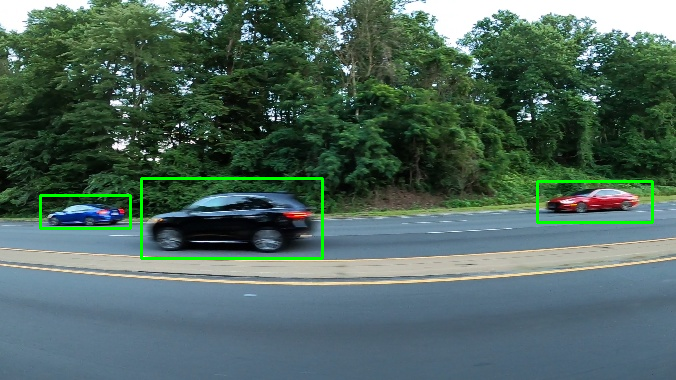

(380, 676, 3)


In [ ]:
# choose a random image
randImage = df.sample().values[0]
sample = df.loc[df['image'] == randImage[0]]

img = cv2.imread(f"{TRAIN_IMG_PATH}/{sample.iloc[[0]]['image'].values[0]}")
for index,row in sample.iterrows():
  cv2.rectangle(img, (int(row[1]), int(row[2])), (int(row[3]), int(row[4])), color=(0, 255, 0), thickness=2)

cv2_imshow(img)
print(img.shape)

## Validation Split

In [ ]:
# Split the coordinates, the first 20% are validaiton
# we are using image IDs because we might have images with multiple bounding boxes

data_files = []
for (dirpath, dirnames, filenames) in os.walk(TRAIN_IMG_PATH):
  data_files.extend(filenames)
  break

DATA_IMAGES = sorted(data_files)
DATA_IMG_COUNT = len(DATA_IMAGES)
val_count = int(DATA_IMG_COUNT * 0.2)

TRAIN_IMAGES = DATA_IMAGES[val_count:]
VAL_IMAGES = DATA_IMAGES[:val_count]

df_bbox_train = df_bbox.loc[df_bbox['image'].isin(TRAIN_IMAGES)]
df_bbox_val = df_bbox.loc[df_bbox['image'].isin(VAL_IMAGES)]

## Create Label Map

In [ ]:
from object_detection.protos.string_int_label_map_pb2 import StringIntLabelMap, StringIntLabelMapItem
from google.protobuf import text_format

msg = StringIntLabelMap()
for id, name in enumerate(['car'], start=1):
  msg.item.append(StringIntLabelMapItem(id=id, name=name))
  
text = str(text_format.MessageToBytes(msg, as_utf8=True), 'utf-8')

with open(f'{TF_BASE_DIR}/workspace/training_demo/annotations/label_map.pbtxt', 'w') as f:
        f.write(text)

## Create TensorFlow Records

In [ ]:
label_map = label_map_util.load_labelmap(f'{TF_BASE_DIR}/workspace/training_demo/annotations/label_map.pbtxt')
label_map_dict = label_map_util.get_label_map_dict(label_map)

In [ ]:
from collections import namedtuple
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import tensorflow.compat.v1 as tf1
from object_detection.utils import dataset_util
import io

def split(df, group):
  data = namedtuple('data', ['image', 'object'])
  gb = df.groupby(group)
  return [data(image, gb.get_group(x)) for image, x in zip(gb.groups.keys(), gb.groups)]
    
def create_tf_record(group, path):
  with tf1.gfile.GFile(f'{TF_BASE_DIR}/workspace/training_demo/images/train/{group.image}', 'rb') as fid:
    encoded_jpg = fid.read()
  encoded_jpg_io = io.BytesIO(encoded_jpg)
  img = Image.open(encoded_jpg_io)
  width, height = img.size

  filename = f'{TF_BASE_DIR}/workspace/training_demo/images/train{group.image}'.encode('utf8')
  image_format = b'jpg'
  xmins = []
  xmaxs = []
  ymins = []
  ymaxs = []
  classes_text = []
  classes = []

  for index, row in group.object.iterrows():
    xmins.append(row['xmin'] / width)
    xmaxs.append(row['xmax'] / width)
    ymins.append(row['ymin'] / height)
    ymaxs.append(row['ymax'] / height)
    # hardcoded the class since we only have one class 'car'
    classes_text.append('car'.encode('utf8'))
    classes.append(label_map_dict['car']) 

  tf_record = tf1.train.Example(features=tf.train.Features(feature={
    'image/height': dataset_util.int64_feature(height),
    'image/width': dataset_util.int64_feature(width),
    'image/filename': dataset_util.bytes_feature(filename),
    'image/source_id': dataset_util.bytes_feature(filename),
    'image/encoded': dataset_util.bytes_feature(encoded_jpg),
    'image/format': dataset_util.bytes_feature(image_format),
    'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
    'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
    'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
    'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
    'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
    'image/object/class/label': dataset_util.int64_list_feature(classes),
  }))
  return tf_record


writer = tf1.python_io.TFRecordWriter(f'{TF_BASE_DIR}/workspace/training_demo/annotations/train.record')
path = os.path.join(f'{TF_BASE_DIR}/workspace/training_demo/images/train')
grouped = split(df_bbox, 'image')

for group in grouped:
    tf_record = create_tf_record(group, path)
    writer.write(tf_record.SerializeToString())
writer.close()

## Download the Pre-Trained Model

In [ ]:
# Choose a pre-trained model and download it into the project pre-trained-model directory
# https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8 "{TF_BASE_DIR}/workspace/training_demo/pre-trained-models/"

--2021-12-17 17:51:54--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.203.128, 2607:f8b0:400c:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.203.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90453990 (86M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_mobilenet_v1_fp 100%[===================>]  86.26M   284MB/s    in 0.3s    

2021-12-17 17:51:55 (284 MB/s) - ‘ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [90453990/90453990]



# Configure the Training Pipline

In [ ]:
# Create a folder for the new model in our project folder
!mkdir "{TF_BASE_DIR}/workspace/training_demo/models/ssd_mobilenet_v1_fpn"
# Copy the pre trained model configuration file into our new model directory
!cp "{TF_BASE_DIR}/workspace/training_demo/pre-trained-models/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/pipeline.config" "{TF_BASE_DIR}/workspace/training_demo/models/ssd_mobilenet_v1_fpn"

In [ ]:
from object_detection.protos import pipeline_pb2

# Reset all state generated by keras
tf.keras.backend.clear_session()
num_classes = 1
pipeline_config = 'models/ssd_mobilenet_v1_fpn/pipeline.config'
checkpoint_path = 'pre-trained-models/ssd_mobilenet_v1_fpn_640x640_coco17_tpu-8/checkpoint/ckpt-0'
label_map_path = 'annotations/label_map.pbtxt'
tf_record_path  = 'annotations/train.record'

# Override model configuration
pipeline = pipeline_pb2.TrainEvalPipelineConfig()  
configs = config_util.get_configs_from_pipeline_file(pipeline_config)

with tf1.gfile.GFile(pipeline_config, "r") as f:                                                                                                                                                                                                                    
    proto_str = f.read()                                                                                                                                                                                                                                          
    text_format.Merge(proto_str, pipeline)

pipeline.model.ssd.num_classes = num_classes
pipeline.model.ssd.freeze_batchnorm = True
pipeline.train_config.batch_size = 20
pipeline.train_config.fine_tune_checkpoint = checkpoint_path
pipeline.train_config.fine_tune_checkpoint_type = "detection"
pipeline.train_input_reader.tf_record_input_reader.input_path[:] = [tf_record_path]
pipeline.train_input_reader.label_map_path = label_map_path
#pipeline.eval_input_reader.tf_record_input_reader.input_path[:] = [tf_record_path]
#pipeline.eval_input_reader.label_map_path = label_map_path

# write back the config file
config_text = text_format.MessageToString(pipeline)                                                                                                                                                                                                        
with tf1.gfile.Open(pipeline_config, "wb") as f:                                                                                                                                                                                                                       
    f.write(config_text)

# Model Training

In [ ]:
%cd /content
%cd "{TF_BASE_DIR}/workspace/training_demo"

%load_ext tensorboard
%tensorboard --logdir=models/ssd_mobilenet_v1_fpn

/content
/content/content/MyDrive/Machine Learning/TensorFlow/workspace/training_demo
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6007 (pid 1877), started 0:00:39 ago. (Use '!kill 1877' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
%cd /content
!cp "content/MyDrive/Machine Learning/TensorFlow/models/research/object_detection/model_main_tf2.py" "{TF_BASE_DIR}/workspace/training_demo"
os.chdir(f'{TF_BASE_DIR}/workspace/training_demo')

!python model_main_tf2.py --model_dir=models/ssd_mobilenet_v1_fpn --pipeline_config_path=models/ssd_mobilenet_v1_fpn/pipeline.config

/content
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1217 18:37:50.429071 140311222724480 mirrored_strategy.py:376] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I1217 18:37:50.435932 140311222724480 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1217 18:37:50.436075 140311222724480 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W1217 18:37:50.459746 140311222724480 deprecation.py:347] From /usr/local/lib/python3.7/dist-packages/object_detection/model_lib_v2.py:564: StrategyBase.experimental_distribute_datasets_from_function (from tensorflow.python.distribute.distribute_lib) is deprecated and will be removed in a future version.
Instructions for updating:
rename to distribute_datasets_from_func

# Model Evaluation

In [ ]:
# we are using the cooc detection metrics as defined in the config file
# make sure we have the cocoa api installed
%cd /content
!git clone https://github.com/cocodataset/cocoapi.git '{TF_BASE_DIR}/models/cocoapi'
%cd "{TF_BASE_DIR}/models/cocoapi/PythonAPI"
!make
!cp -r pycocotools "{TF_BASE_DIR}/models/research/"

In [ ]:
%cd /content
%cd "{TF_BASE_DIR}/workspace/training_demo"
!python model_main_tf2.py --model_dir=models/ssd_mobilenet_v1_fpn --pipeline_config_path=models/ssd_mobilenet_v1_fpn/pipeline.config --checkpoint_dir=models/ssd_mobilenet_v1_fpn

/content
/content/content/MyDrive/Machine Learning/TensorFlow/workspace/training_demo
W1217 18:33:16.299128 140134359033728 model_lib_v2.py:1090] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I1217 18:33:16.299355 140134359033728 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1217 18:33:16.299422 140134359033728 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1217 18:33:16.299484 140134359033728 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W1217 18:33:16.299569 140134359033728 model_lib_v2.py:1111] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
INFO:tensorflow:Reading unweighted datasets: ['annotations/train.record']
I1217 18:33:17.029757 140134359033728 datas

# Utility Functions

In [ ]:
# Those functions are taken from tensorflow documentation examples and they help
# in loading the model and visualizing the results using the TensorFlow object detection API

def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))

  return model

def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

# Attempt 2: Using Tensorflow hub

In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [ ]:
def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               thickness=3,
                               display_str_list=()):
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

In [ ]:
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  colors = list(ImageColor.colormap.values())

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

In [ ]:
detector = hub.load("https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1").signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [ ]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  0.9392735958099365


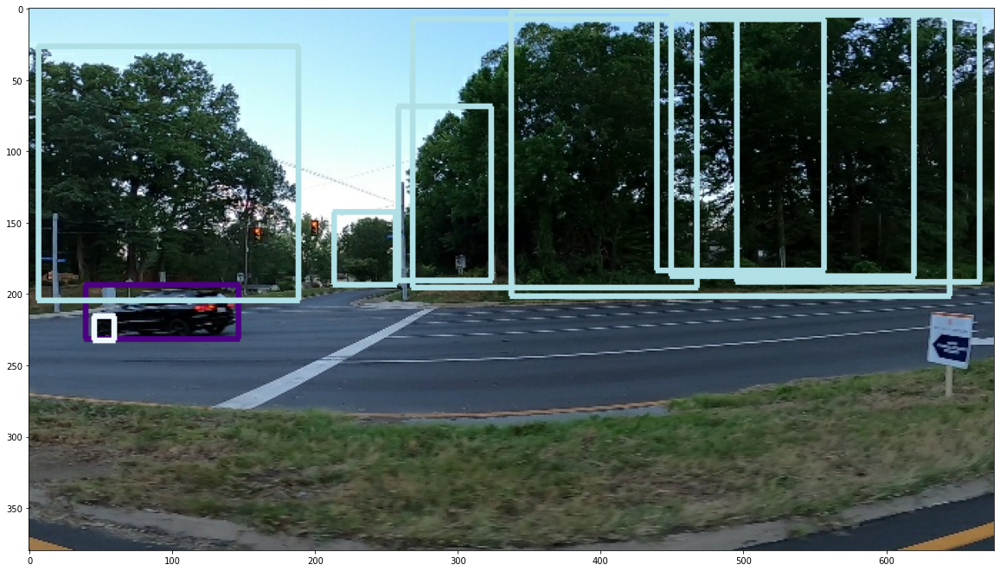

In [ ]:
run_detector(detector, f'{TRAIN_IMG_PATH}/{train_files[10]}')

# Attemp 3: Running the Detector Only without Training

In [ ]:
model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
detection_model = load_model(model_name)

76546048/76534733 [==============================] - 1s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
print(detection_model.signatures['serving_default'].inputs)

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


In [ ]:
detection_model.signatures['serving_default'].output_dtypes

{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'detection_scores': tf.float32,
 'num_detections': tf.float32}

In [ ]:
detection_model.signatures['serving_default'].output_shapes

{'detection_boxes': TensorShape([None, 100, 4]),
 'detection_classes': TensorShape([None, 100]),
 'detection_scores': TensorShape([None, 100]),
 'num_detections': TensorShape([None])}

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [ ]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  start_time = time.time()
  output_dict = run_inference_for_single_image(model, image_np)
  end_time = time.time()

  category_index = {1: {'id': 1, 'name': 'car'}}

  print("Found %d objects." % len(list(filter(lambda score: score >= 0.5, output_dict["detection_scores"]))))
  print("Inference time: ", end_time-start_time)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

/content
Found 5 objects.
Inference time:  4.085342645645142


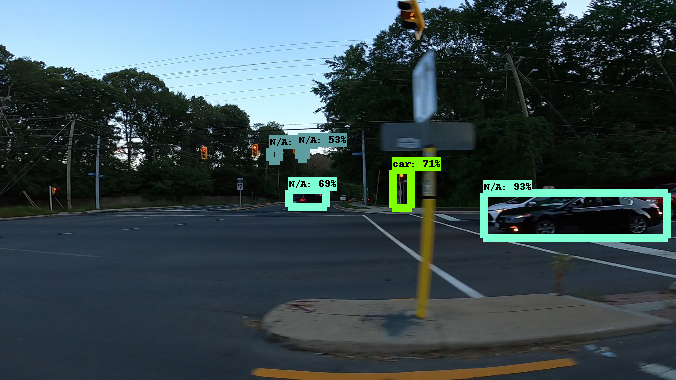

Found 5 objects.
Inference time:  0.07316207885742188


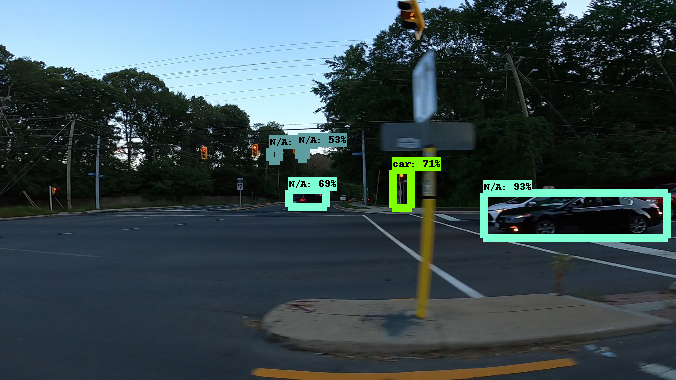

Found 7 objects.
Inference time:  0.07275199890136719


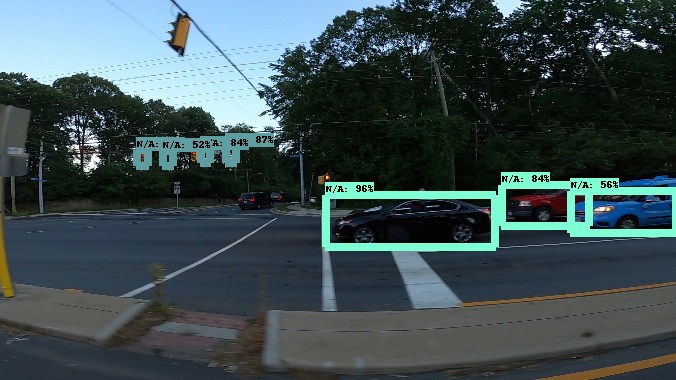

In [ ]:
%cd /content
for index, row in df.iloc[50:53].iterrows():
  show_inference(detection_model, TRAIN_IMG_PATH + '/' + row['image'])